**Task 1:**

The first task is to classify the images into 20 classes( person, bird, cat, cow, dog, horse, sheep, aeroplane, bicycle, boat, bus, car, motorbike, train, bottle, chair, dining table, potted plant, sofa, tv/monitor). As the dataset is for image description tasks, you won't find the image labels off-the-shelf, but need to scrape it using the 50 sentence descriptions associated with each image. There might be cases where the exact class names are not present in the description. Think of an approach to overcome this issue. Also, some images may contain more than two objects belonging to different classes. So, basically treat this as a multi-label classification problem. Next, using the images and the scraped labels, perform simple image classification using deep convolutional neural networks. 

#Loading dataset

In [1]:
from scipy.io import loadmat
ann=loadmat('abstract50S.mat')
print(ann)

{'__header__': b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Sun Mar 23 18:40:29 2014', '__version__': '1.0', '__globals__': [], 'abs_sent': array([[(array([[array(['Mike and Jenny are enjoying a game of baseball.'], dtype='<U47'),
        array(['Mike and Jenny are playing baseball outside.'], dtype='<U44'),
        array(['Jenny and Mike have fun playing baseball.'], dtype='<U41'),
        array(['Mike and Jenny are playing baseball without a ball.'],
      dtype='<U51'),
        array(['Jenny and Mike are playing baseball.'], dtype='<U36'),
        array(['Jenny is holding a baseball bat while Mike is smiling with a glove and hat on.'],
      dtype='<U78'),
        array(['Mike and Jenny are playing baseball at the park.'], dtype='<U48'),
        array(['Mike and Jenny are playing baseball while the cat watches from a distance.'],
      dtype='<U74'),
        array(['Jill is running with a baseball bat towards Jack with a catchers glove.'],
      dtype='<U71'),
        array

In [2]:
ann1=loadmat('pascal50S.mat')
ann1


{'__globals__': [],
 '__header__': b'MATLAB 5.0 MAT-file, Platform: GLNXA64, Created on: Tue Feb 25 21:04:39 2014',
 '__version__': '1.0',
 'train_sent_final': array([[(array(['https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_006488.jpg'],
       dtype='<U58'), array([[array(['Man in a boat fishing.'], dtype='<U22'),
         array(['a man fishing out of a canoe'], dtype='<U28'),
         array(['A lone fisherman in a rowboat on an empty lake.'], dtype='<U47'),
         array(['A person is fishing in a boat on a lake.'], dtype='<U40'),
         array(['A man is fishing in the river.'], dtype='<U30'),
         array(['A man fishing in a canoe on a lake'], dtype='<U34'),
         array(['A man fishes in a canoe in an empty lake'], dtype='<U40'),
         array(['A man in a canoe is fishing.'], dtype='<U28'),
         array(['A person in a canoe fishes on a lake.'], dtype='<U37'),
         array(['A man in his canoe fishing on the lake.'], dtype='<U39'),
         array(['A man is fishing i

#image URL extraction

In [3]:

ann1['train_sent_final'][0][0][0]
url=[]
for i in range(0,1000):
  url.append(str(ann1['train_sent_final'][0][i][0][0]))
url

['https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_006488.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_008632.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_003378.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_008048.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_002567.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_004441.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_002467.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_002395.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_006397.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_004621.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_002222.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_007519.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_006112.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_007286.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_005798.jpg',
 'https://filebox.ece.vt.edu/~vrama91/PASCAL/2008_00859

#image download

In [4]:

import urllib.request

#the image on the web
#local name to be saved
for i in range(0,1000):

 urllib.request.urlretrieve(url[i], str(i)+".jpg")

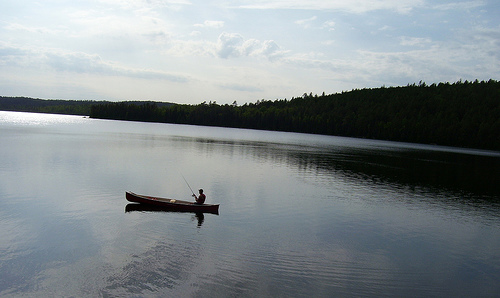

In [5]:
from PIL import Image
filename=[]
for i in range(0,1000):
  filename.append(str(i)+".jpg")
img=[]
for i in range(0,1000):

 img.append(Image.open(filename[i]))

img[0]

#image resize

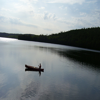

In [6]:

imgr=[]
for i in range(0,1000):
  imgr.append(img[i].resize((100, 100)))
imgr[0]

#convert picture into arrays

In [8]:

import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
pix=[]
for i in range(0,1000):
 pix.append(np.array(imgr[i].getdata()).reshape(imgr[i].size[0], imgr[i].size[1], 3))


#convert list of image arrays into an array

In [9]:

data=np.array(pix)
data.shape

(1000, 100, 100, 3)

#divide into train and test

In [10]:

Xtrain=[]
XTest=[]
Xtrain=pix[0:600]
Xtest=pix[600:1000]
Xtrain1=np.asarray(Xtrain)
Xtest1=np.asarray(Xtest)
Xtrain1=np.asarray(Xtrain1).astype(np.float32)
Xtest1=np.asarray(Xtest1).astype(np.float32)



In [11]:
data[0][0]

array([[216, 234, 242],
       [218, 235, 243],
       [222, 236, 245],
       [224, 239, 246],
       [225, 240, 247],
       [225, 240, 247],
       [228, 241, 248],
       [229, 241, 248],
       [228, 240, 249],
       [230, 242, 250],
       [230, 242, 250],
       [232, 244, 249],
       [232, 243, 250],
       [230, 242, 250],
       [228, 241, 249],
       [229, 242, 249],
       [229, 242, 249],
       [230, 242, 248],
       [234, 244, 248],
       [236, 246, 248],
       [243, 249, 250],
       [244, 248, 250],
       [245, 249, 250],
       [246, 249, 249],
       [244, 248, 249],
       [243, 247, 248],
       [244, 247, 246],
       [243, 246, 246],
       [236, 241, 243],
       [225, 233, 237],
       [230, 235, 239],
       [234, 239, 242],
       [231, 237, 240],
       [233, 240, 242],
       [238, 243, 244],
       [239, 243, 244],
       [239, 243, 244],
       [232, 238, 241],
       [220, 232, 238],
       [218, 231, 239],
       [217, 230, 238],
       [216, 229

In [17]:
#this block is for rough work
# depends on a later block
#len(ann1['train_sent_final'][0])
#for i in range(0,1000):
  #print(ann1['train_sent_final'][0][i])
#a=str(ann1['train_sent_final'][0][0][0][0])
#a
#testlist=[]
#print(testlist)
#for k in words[0][0]:
#  if k in classes:
 #  print(k)
  # testlist.append(k)
   #print(testlist)

[]
boat
['boat']


#Primal clssification preparation

In [13]:

classes=['person','bird','cat','cow','dog','horse','sheep','plane','bicycle','boat','bus','car','motorbike','train','bottle','chair','dining table','potted plant','sofa','tv','monitor']
sent=[]
for i in range(0,1000):
  temp=[]
  for j in range(0,50):
   temp.append(list(ann1['train_sent_final'][0][i][1][0][j]))
  sent.append(temp)
print(len(classes))
sent





21


[[['Man in a boat fishing.'],
  ['a man fishing out of a canoe'],
  ['A lone fisherman in a rowboat on an empty lake.'],
  ['A person is fishing in a boat on a lake.'],
  ['A man is fishing in the river.'],
  ['A man fishing in a canoe on a lake'],
  ['A man fishes in a canoe in an empty lake'],
  ['A man in a canoe is fishing.'],
  ['A person in a canoe fishes on a lake.'],
  ['A man in his canoe fishing on the lake.'],
  ['A man is fishing in the sea by a forest.'],
  ['A person in a canoe fishing on a lake surrounded by hills.'],
  ['a man fishing in the middle of a lake in a boat'],
  ['a person fishes while sitting in a canoe on a lake'],
  ['A man in canoe fishing on a lake'],
  ['A man is fishing in a small boat on a lake.'],
  ['A man fishing alone on the lake.'],
  ['A man is fishing on a lake.'],
  ['Someone is fishing from a canoe on a lake.'],
  ['A person is fishing in the water all by themselves.'],
  ['A small boat in the middle of the lake.'],
  ['A man is fishing from 

In [14]:

sent[0][0][0]

'Man in a boat fishing.'

In [15]:

aa=[]
words=[]

for i in range(0,1000):
  tempor1=[]
  for j in range(0,50):
    tempor1.append(sent[i][j][0].split(" "))
  words.append(tempor1)



In [16]:
words[1][0]

['Train', 'and', 'flags', 'in', 'snow.']

In [20]:

labels=[]
for i in range(0,1000):
  tempor=[]
  for j in range(0,50):
    for k in words[i][j]:
      if k in classes and k not in tempor :
        #print(k)
        tempor.append(k)
        #print(tempor)
  
  labels.append(tempor)
  
print(labels)


[['boat', 'person'], ['train', 'car'], ['car', 'bus', 'train'], [], [], ['bicycle', 'car'], ['bottle'], ['dog'], ['horse', 'person'], ['sheep'], ['train', 'bus'], ['dog'], [], ['dog', 'person'], ['dog', 'sofa'], ['person'], [], ['person', 'car', 'bicycle'], ['bus'], ['bottle'], [], ['bird'], ['train'], ['person', 'motorbike'], ['cat', 'dog'], [], ['horse'], ['bird'], ['car', 'person'], ['dog', 'person'], ['chair', 'bottle', 'sofa'], ['bottle'], ['plane'], ['motorbike', 'bicycle'], ['bottle', 'person'], ['dog', 'chair'], ['dog'], ['cow'], ['person', 'bottle'], ['bottle'], [], ['cow'], ['bird'], ['sheep'], ['bicycle', 'person'], ['cow'], ['sofa'], ['sofa'], [], ['chair', 'tv', 'person'], ['boat'], ['person', 'bicycle'], ['plane'], [], ['cow', 'sheep', 'person'], ['car'], [], ['sofa'], ['chair'], ['chair'], ['plane'], ['car'], ['plane'], ['car', 'cow'], ['car'], ['train'], [], ['bus', 'train'], ['sheep'], ['monitor'], ['bus'], ['train'], ['plane'], ['car', 'person'], [], ['monitor'], ['ca

In [21]:
#rough work on indexes
ann1['train_sent_final'][0][3][1][0]

array([array(['A team of planes stream past.'], dtype='<U29'),
       array(['A group of planes fly in formation with contrails following.'],
      dtype='<U60'),
       array(['A group of planes flies through the sky.'], dtype='<U40'),
       array(['A group of jets are flying in formation and trailing red, white, and blue smoke.'],
      dtype='<U80'),
       array(['A group of stunt pilots do a show'], dtype='<U33'),
       array(['A group of nine red airplanes flying through the sky.'],
      dtype='<U53'),
       array(['Jets performing a air-show in the blue skies.'], dtype='<U45'),
       array(['Nine planes flying high with smoke trails.'], dtype='<U42'),
       array(['Nine jets flying in formation and leaving jet trails.'],
      dtype='<U53'),
       array(['An air craft show is going on in the sky.'], dtype='<U41'),
       array(['A air show performing in the sky.'], dtype='<U33'),
       array(['a group of planes fly in formation while releasing smoke'],
      dtype='<U56'

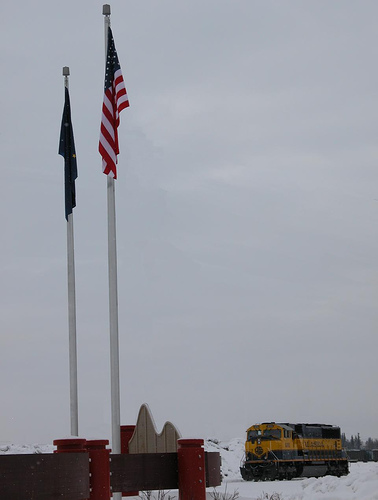

In [22]:
img[1]

In [23]:
#create numeral identifier for labels
Target=[]
Num_labels=[]
for i in range(0,len(classes)):
  Target.append(i)
for i in range(0,1000):
  temp=[]
  for j in range(0,len(labels[i])):
    temp_var=labels[i][j]
    for k in range(0,len(classes)):
      if temp_var==classes[k]:
        temp.append(k)
  

  Num_labels.append(temp)
#Target gives each class a numerical identifier in the order of their appearance


In [24]:
#Testing the numeric labels
print(Num_labels[0])
print(labels[0])
Y=[]
for i in range (0,1000):
  temp=[]
  for j in range(0,21):
    temp.append(0)
  Y.append(temp)
print(Y[0])
for i in range(0,1000):
  for j in range(0,len(labels[i])):
    ind=classes.index(labels[i][j])
    print(ind)
    Y[i][ind]=1


[9, 0]
['boat', 'person']
[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
9
0
13
11
11
10
13
8
11
14
4
5
0
6
13
10
4
4
0
4
18
0
0
11
8
10
14
1
13
0
12
2
4
5
1
11
0
4
0
15
14
18
14
7
12
8
14
0
4
15
4
3
0
14
14
3
1
6
8
0
3
18
18
15
19
0
9
0
8
7
3
6
0
11
18
15
15
7
11
7
11
3
11
13
10
13
6
20
10
13
7
11
0
20
2
0
18
11
3
13
15
13
7
18
6
3
0
12
10
5
3
9
14
13
10
3
15
1
8
3
6
13
11
2
1
14
4
0
7
19
9
3
13
11
13
11
6
18
6
2
1
10
0
20
15
10
0
8
4
0
5
9
0
12
8
0
12
15
0
7
2
15
10
5
5
3
10
7
13
11
18
19
12
0
3
2
12
11
9
0
3
20
3
4
14
11
8
0
5
3
4
18
0
15
18
15
11
1
7
7
0
19
15
7
7
11
10
2
11
0
11
0
8
1
5
4
2
8
0
4
10
11
10
0
20
2
18
4
7
6
4
4
7
18
15
13
8
0
8
10
15
7
4
11
15
7
6
6
2
5
0
6
13
11
7
9
3
14
11
10
6
20
15
1
20
5
0
18
15
15
8
12
13
0
8
6
4
11
14
0
14
14
3
0
13
0
11
7
15
4
0
5
0
5
10
1
0
0
8
9
9
5
19
4
19
13
10
6
0
4
6
10
11
9
0
5
4
7
18
15
19
0
4
19
0
20
6
13
3
6
0
1
7
2
15
1
13
0
7
4
15
2
5
1
6
2
18
14
18
0
5
11
11
8
2
6
5
13
11
4
0
20
15
11
13
19
15
18
2
3
0
12
15
6
3


In [25]:

Ytrain=np.asarray(Y[0:600])
Ytest=np.asarray(Y[600:1000])



In [26]:
import tensorflow as tf
from keras.layers import BatchNormalization
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dense, Dropout, Flatten
model = tf.keras.models.Sequential()
model.add(Conv2D(filters=16, kernel_size=(5, 5), activation="relu", input_shape=(100,100,3)))
model.add(BatchNormalization())

model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

model.add(Conv2D(filters=32, kernel_size=(5, 5), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Dropout(0.2))

model.add(Conv2D(filters=64, kernel_size=(5, 5), activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Dropout(0.2))

model.add(Conv2D(filters=64, kernel_size=(5, 5), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(BatchNormalization())
model.add(Dropout(0.2))

model.add(Flatten())
model.add(Dense(256, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(128, activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(21, activation='sigmoid'))
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
#model.summary()
classify=model.fit(Xtrain1, Ytrain, epochs=20, validation_data=(Xtest1, Ytest), batch_size=64)

Epoch 1/20
10/10 [==============================] - 12s 1s/step - loss: 0.8474 - accuracy: 0.0484 - val_loss: 0.3191 - val_accuracy: 0.3350
Epoch 2/20
10/10 [==============================] - 10s 1s/step - loss: 0.4148 - accuracy: 0.0969 - val_loss: 0.4850 - val_accuracy: 0.3350
Epoch 3/20
10/10 [==============================] - 10s 1s/step - loss: 0.3214 - accuracy: 0.0860 - val_loss: 0.4982 - val_accuracy: 0.3350
Epoch 4/20
10/10 [==============================] - 10s 1s/step - loss: 0.2799 - accuracy: 0.1295 - val_loss: 0.3132 - val_accuracy: 0.2975
Epoch 5/20
10/10 [==============================] - 10s 1s/step - loss: 0.2578 - accuracy: 0.1188 - val_loss: 0.2325 - val_accuracy: 0.2975
Epoch 6/20
10/10 [==============================] - 10s 1s/step - loss: 0.2567 - accuracy: 0.1074 - val_loss: 0.2419 - val_accuracy: 0.2850
Epoch 7/20
10/10 [==============================] - 10s 1s/step - loss: 0.2524 - accuracy: 0.1065 - val_loss: 0.2256 - val_accuracy: 0.3325
Epoch 8/20
10/10 [==

In [27]:
pred=model.predict(Xtrain1)
pred[0]

array([0.29125643, 0.03322431, 0.02661073, 0.07641488, 0.02712688,
       0.05359146, 0.07098553, 0.03620818, 0.11130929, 0.07103056,
       0.06472984, 0.06381989, 0.02789998, 0.04699144, 0.02936238,
       0.0561592 , 0.00312334, 0.00500962, 0.02118906, 0.03486076,
       0.01910716], dtype=float32)

[9, 0]
['boat', 'person']
['person', 'bird', 'cat', 'cow', 'dog', 'horse', 'sheep', 'plane', 'bicycle', 'boat', 'bus', 'car', 'motorbike', 'train', 'bottle', 'chair', 'dining table', 'potted plant', 'sofa', 'tv', 'monitor']


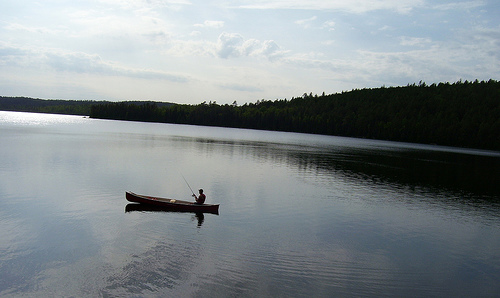

In [28]:
#correspond to above result for image 1
print(Num_labels[0])
print(labels[0])
print(classes)
img[0]
